In [1]:
from collections import deque

class AVLNode:
    def __init__(self, data):
        self.data = data
        self.left = None
        self.right = None
        self.height = 1

def preOrderTraversal(rootNode):
    if not rootNode:
        return
    print(rootNode.data)
    preOrderTraversal(rootNode.left)
    preOrderTraversal(rootNode.right)

def inOrderTraversal(rootNode):
    if not rootNode:
        return
    inOrderTraversal(rootNode.left)
    print(rootNode.data)
    inOrderTraversal(rootNode.right)

def postOrderTraversal(rootNode):
    if not rootNode:
        return
    postOrderTraversal(rootNode.left)
    postOrderTraversal(rootNode.right)
    print(rootNode.data)

def levelOrderTraversal(rootNode):
    if not rootNode:
        return
    else:
        queue = deque()
        queue.append(rootNode)
        while queue:
            root = queue.popleft()
            print(root.data)
            if root.left:
                queue.append(root.left)
            if root.right:
                queue.append(root.right)

def searchBST(rootNode, data):
    if rootNode:
        if rootNode.data == data:
            print("found")
        elif rootNode.data < data:
            if rootNode.right:
                if rootNode.right.data == data:
                    print("found")
                else:
                    searchBST(rootNode.right, data)
        else:
            if rootNode.left:
                if rootNode.left.data == data:
                    print("found")
                else:
                    searchBST(rootNode.left, data)

def getHeight(rootNode):
    if not rootNode:
        return
    else:
        return rootNode.height
    
def rightRotate(disbalanceNode):
    newRoot = disbalanceNode.left
    disbalanceNode.left = disbalanceNode.left.right
    newRoot.right = disbalanceNode
    disbalanceNode.height = 1 + max(getHeight(disbalanceNode.left), getHeight(disbalanceNode.right))
    newRoot.height = 1 + max(getHeight(newRoot.left), getHeight(newRoot.right))
    return newRoot

def leftRotate(disbalanceNode):
    newRoot = disbalanceNode.right
    disbalanceNode.right = disbalanceNode.right.left
    newRoot.left = disbalanceNode
    disbalanceNode.height = 1 + max(getHeight(disbalanceNode.left), getHeight(disbalanceNode.right))
    newRoot.height = 1 + max(getHeight(newRoot.left), getHeight(newRoot.right))
    return newRoot

def getBalance(rootNode):
    if not rootNode:
        return 0
    return getHeight(rootNode.left) - getHeight(rootNode.right)

def insertNode(rootNode, nodeValue):
    if not rootNode:
        return AVLNode(nodeValue)
    elif nodeValue < rootNode.data:
        rootNode.left = insertNode(rootNode.left, nodeValue)
    else:
        rootNode.right = insertNode(rootNode.right, nodeValue)
    
    rootNode.height = 1 + max(getHeight(rootNode.left), getHeight(rootNode.right))
    balance = getBalance(rootNode)
    if balance > 1 and nodeValue < rootNode.left.data:
        return rightRotate(rootNode)
    if balance > 1 and nodeValue > rootNode.left.data:
        rootNode.left = leftRotate(rootNode.left)
        return rightRotate(rootNode)
    if balance < -1 and nodeValue > rootNode.right.data:
        return leftRotate(rootNode)
    if balance < -1 and nodeValue < rootNode.right.data:
        rootNode.right = rightRotate(rootNode.right)
        return leftRotate(rootNode)
    return rootNode

def getMinValueNode(rootNode):
    if rootNode is None or rootNode.left is None:
        return rootNode
    return getMinValueNode(rootNode.left)

def deleteNode(rootNode, nodeValue):
    if not rootNode:
        return rootNode
    elif nodeValue < rootNode.data:
        rootNode.left = deleteNode(rootNode.left, nodeValue)
    elif nodeValue > rootNode.data:
        rootNode.right = deleteNode(rootNode.right, nodeValue)
    else:
        if rootNode.left is None:
            temp = rootNode.right
            rootNode = None
            return temp
        elif rootNode.right is None:
            temp = rootNode.left
            rootNode = None
            return temp
        temp = getMinValueNode(rootNode.right)
        rootNode.data = temp.data
        rootNode.right = deleteNode(rootNode.right, temp.data)
    balance = getBalance(rootNode)
    if balance > 1 and getBalance(rootNode.left) >= 0:
        return rightRotate(rootNode)
    if balance < -1 and getBalance(rootNode.right) <= 0:
        return leftRotate(rootNode)
    if balance > 1 and getBalance(rootNode.left) < 0:
        rootNode.left = leftRotate(rootNode.left)
        return rightRotate(rootNode)
    if balance < -1 and getBalance(rootNode.right) > 0:
        rootNode.right = rightRotate(rootNode.right)
        return leftRotate(rootNode)
    
    return rootNode

def deleteAVL(rootNode):
    rootNode.data = None
    rootNode.left = None
    rootNode.right = None
    return "The AVL has been successfully deleted"


In [2]:
new_avl = AVLNode(10)

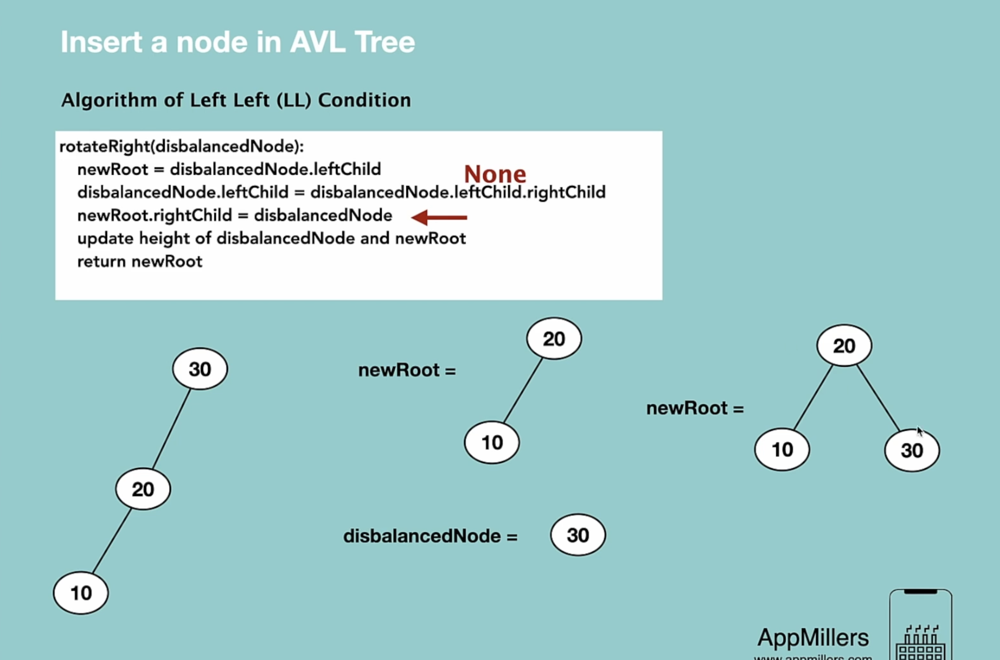

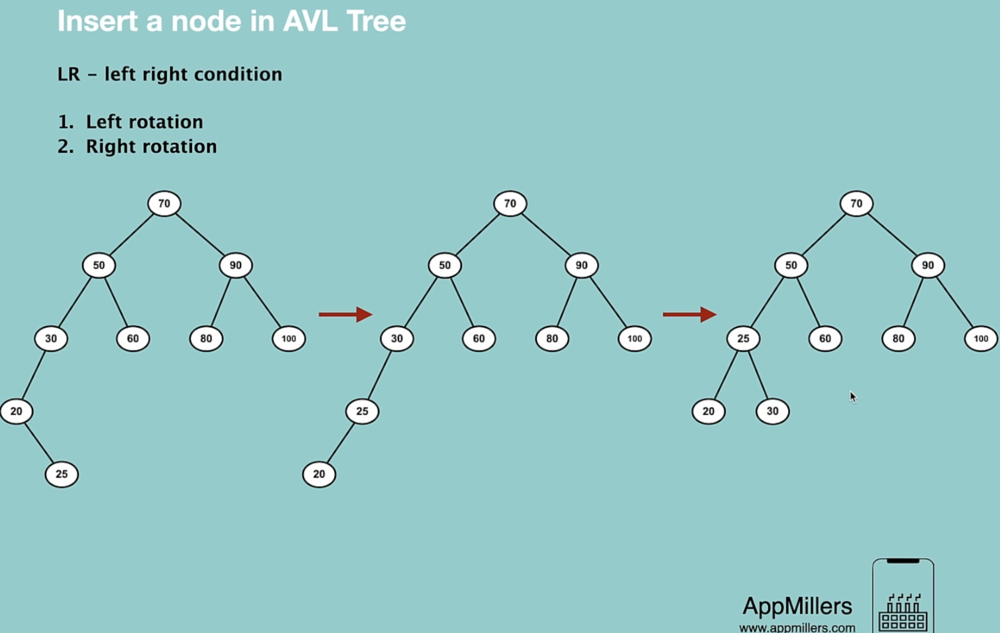

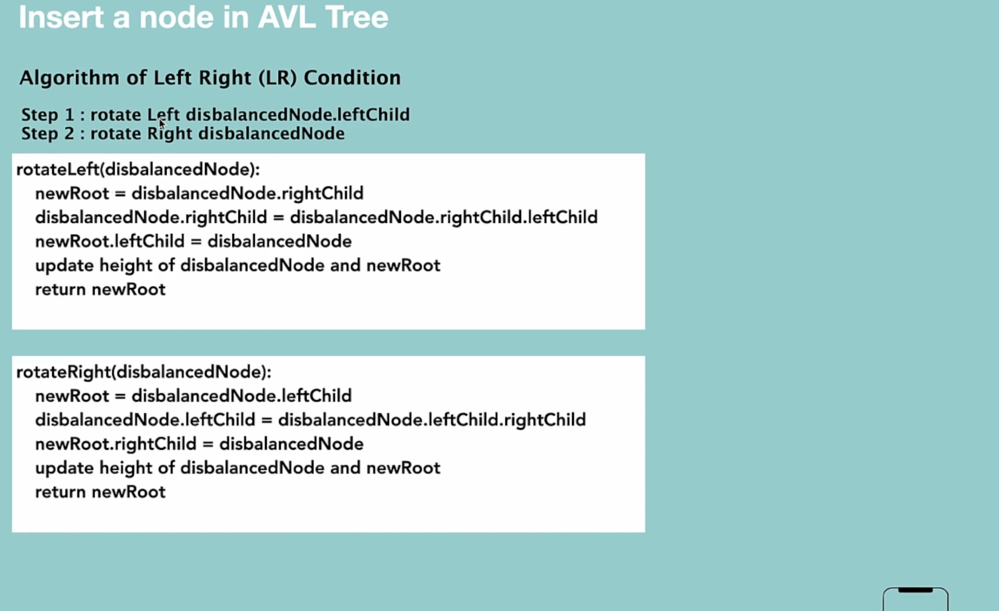


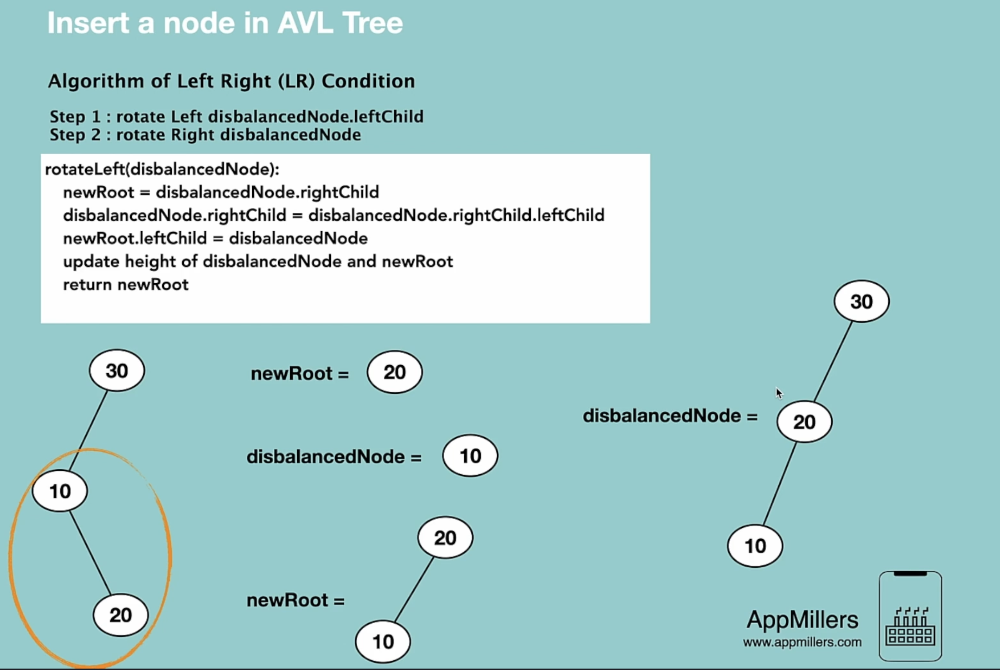


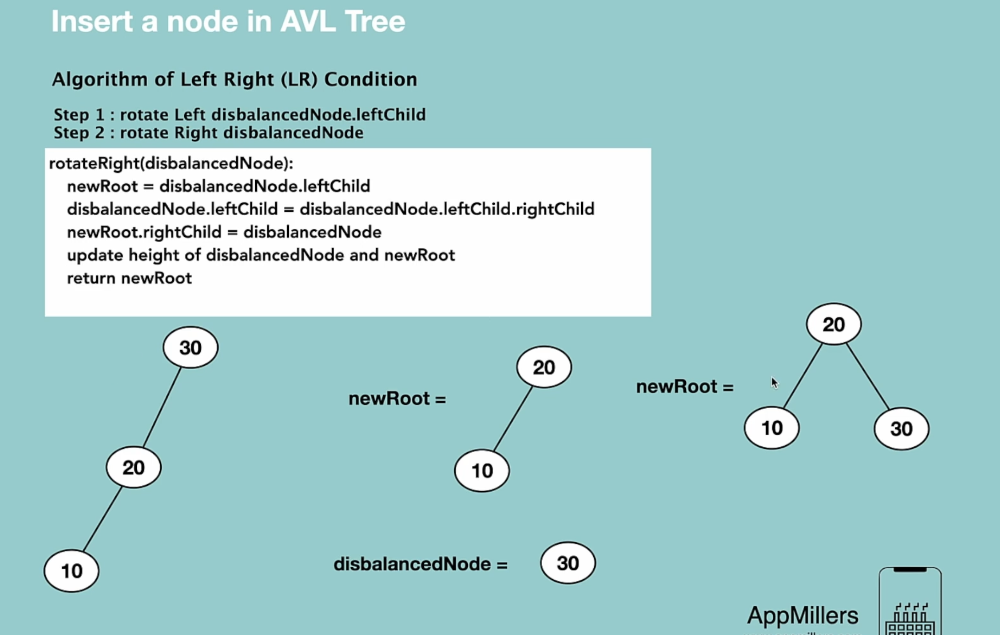

...

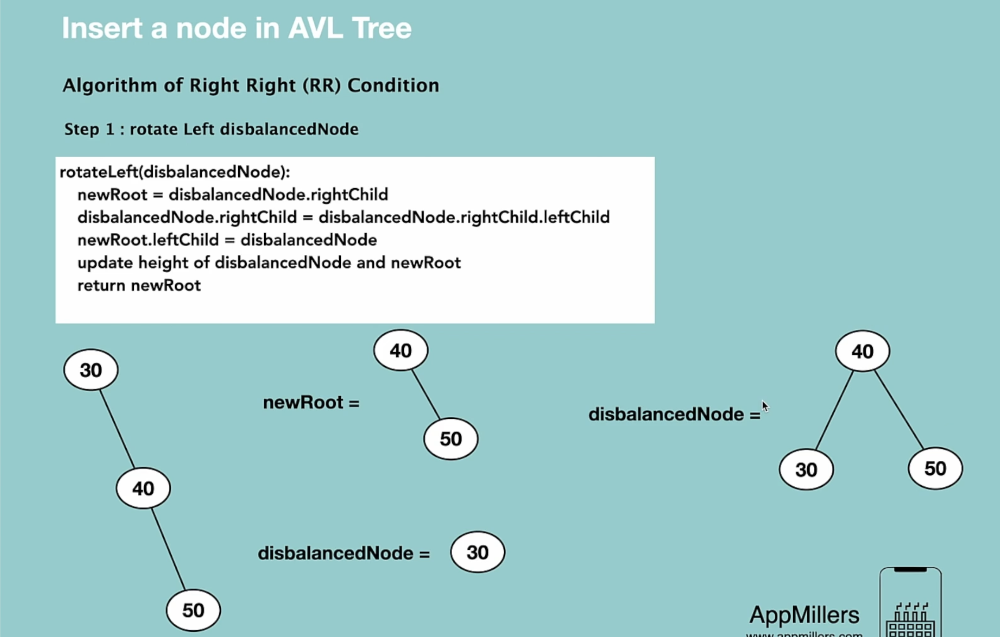

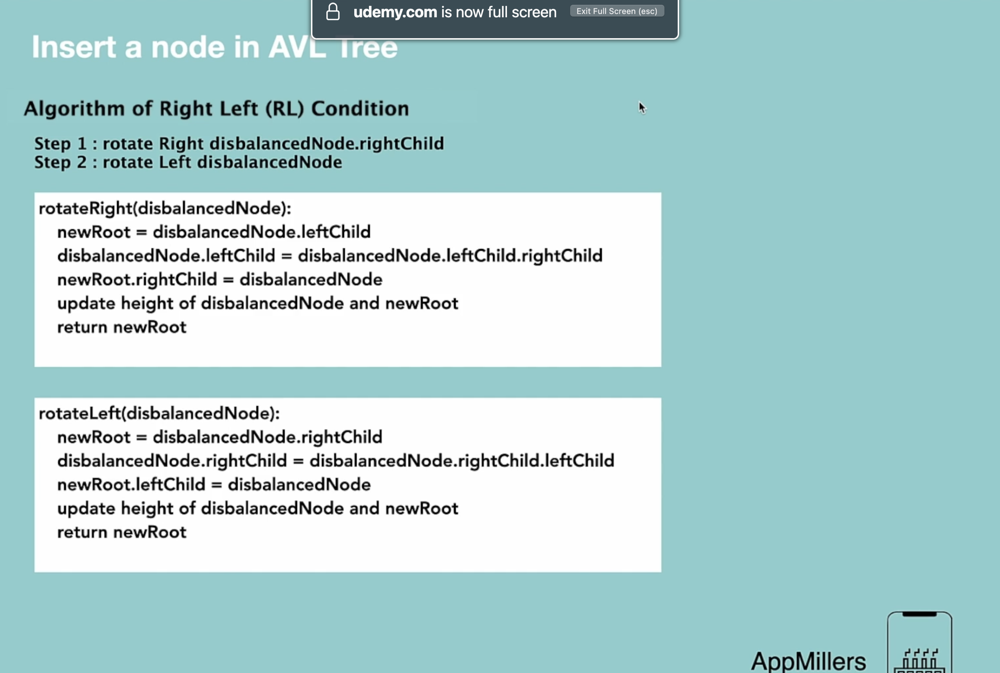


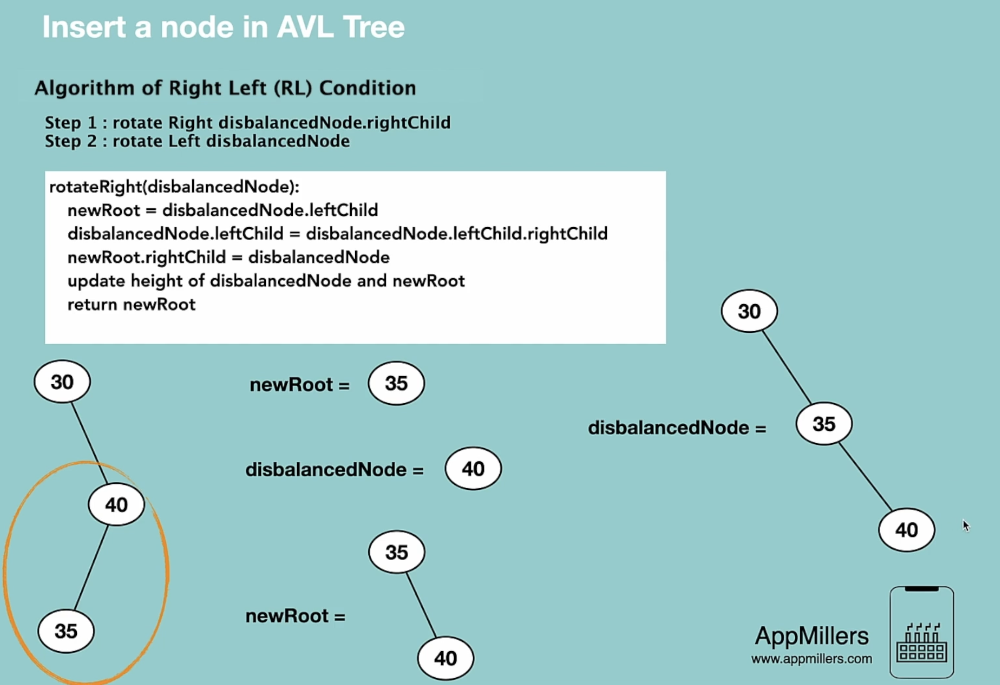


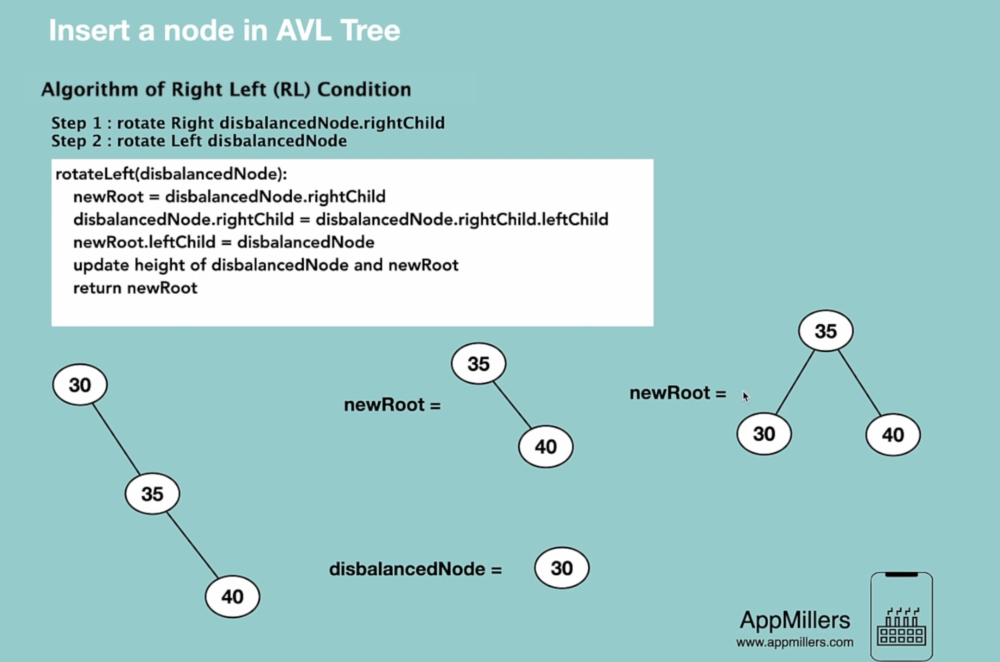
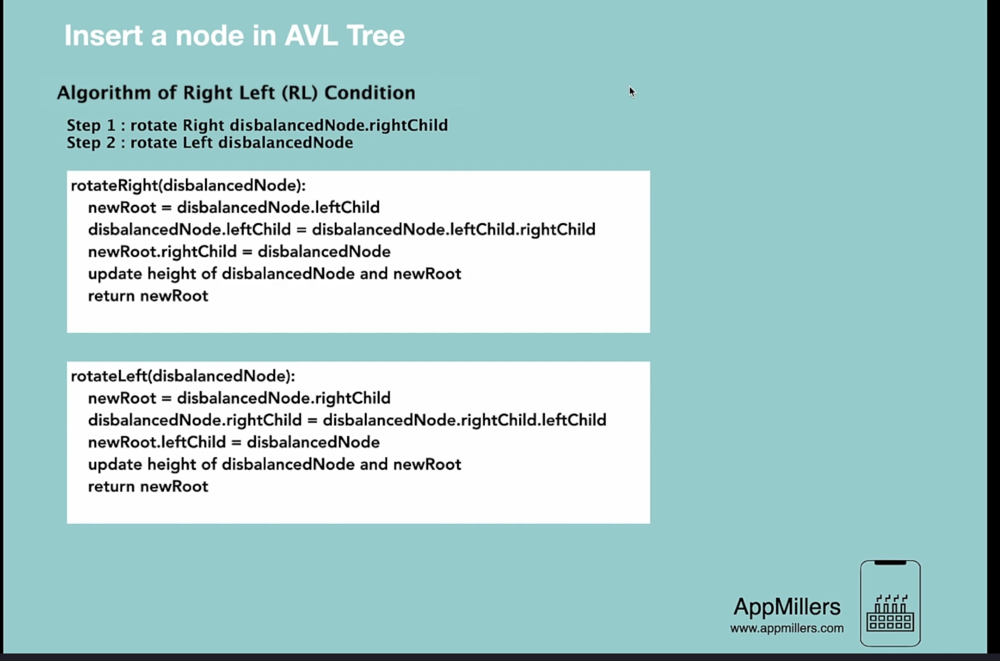

https://www.udemy.com/course/data-structures-and-algorithms-bootcamp-in-python/learn/lecture/21076342#overview